In [1]:
cd("/home/gadus/programing-projects/julia-projects/ThreeStageModel/")
using DataFrames, JLD2, LambdaFn, Plots, StatsBase, StatsPlots, CategoricalArrays



selection_coefficients::Vector{Float64} = [0.1,0.2,0.3]
cline_widths::Vector{Float64} = [10,15,20]


carring_capacity::Int64 = 200
reproductive_rate::Float64 = 1.1
number_of_patches::Int64 = 300
individuals_per_patch::Int64 = 100
generations = 10000

global cache_multistage = (vars = Vector{Float64}(undef, 2),
                    genotype_counts  = Array{Int16}(undef, 100, 100 + ceil(Int, (generations - 100)/10), number_of_patches, 5, 3),
                    population_sizes = Array{Int16}(undef, 100, 100 + ceil(Int, (generations - 100)/10), number_of_patches, 5),
                    genotype_frequencies = Array{Float32}(undef, 100, 100 + ceil(Int, (generations - 100)/10), number_of_patches, 5, 3),
                    fitnesses = Array{Float32}(undef,100, 100 + ceil(Int, (generations - 100)/10), number_of_patches, 5))
global cache_single_stage = (vars = [0.,0.,""],
                     genotype_counts  = Array{Int16}(undef, 100, 100 + ceil(Int, (generations - 100)/10), number_of_patches, 3),
                     population_sizes = Array{Int16}(undef, 100, 100 + ceil(Int, (generations - 100)/10), number_of_patches),
                     genotype_frequencies = Array{Float32}(undef, 100, 100 + ceil(Int, (generations - 100)/10), number_of_patches, 3),
                     fitnesses = Array{Float32}(undef,100, 100 + ceil(Int, (generations - 100)/10), number_of_patches))

#genotype_counts = Array{Int16}(undef, generations, number_of_patches, 5, 3, 3, 3)
function load_results_threestage!(cache, selection_coefficients, dispersal_distance)
    if (cache.vars != [selection_coefficients, dispersal_distance])
        cache.vars .= [selection_coefficients, dispersal_distance]
        cache.genotype_counts .= load_object("/home/gadus/programing-projects/julia-projects/ThreeStageModel/results/genotype_counts_s_$(selection_coefficients)_l_$(dispersal_distance)_r_1.1.jld2")
        cache.population_sizes .= sum.(eachslice(cache.genotype_counts, dims = (1,2,3,4)))
        cache.genotype_frequencies .= cache.genotype_counts ./ cache.population_sizes
        cache.fitnesses[:, :, 1:150,: ]   .= cache.genotype_frequencies[:,:,1:150,:,1]                                     .+ cache.genotype_frequencies[:,:,1:150  ,:,2] .* (1 - selection_coefficients) .+ cache.genotype_frequencies[:,:,  1:150,:,3] .* (1 - 2*selection_coefficients)
        cache.fitnesses[:, :, 151:300,: ] .= cache.genotype_frequencies[:,:,151:300,:,1] .* (1 - 2*selection_coefficients) .+ cache.genotype_frequencies[:,:,151:300,:,2] .* (1 - selection_coefficients) .+ cache.genotype_frequencies[:,:,151:300,:,3]
    end
    return nothing
end
function load_results_one_stage!(cache, selection_coefficient, dispersal_distance, model)
    dir = "/home/gadus/programing-projects/julia-projects/SimpleModel"
    if (cache.vars != [selection_coefficient, dispersal_distance, model])
        cache.vars .= [selection_coefficient, dispersal_distance, model]
        cache.genotype_counts .= (model == "poisson") ? load_object("$dir/results-poisson-model/genotype_counts_s_$(selection_coefficient)_l_$(dispersal_distance)_r_1.1.jld2") :
                                                        (model == "binomial") ? load_object("$dir/results-binomial-model/genotype_counts_s_$(selection_coefficient)_l_$(dispersal_distance)_r_1.1.jld2") : 
                                                                                throw("Incorrect model type")
        cache.population_sizes .= sum.(eachslice(cache.genotype_counts, dims = (1,2,3)))
        cache.genotype_frequencies .= cache.genotype_counts ./ cache.population_sizes
        cache.fitnesses[:, :, 1:150]   .= (cache.genotype_frequencies[:,:,  1:150,1] 
                                       .+  cache.genotype_frequencies[:,:,  1:150,2] .* (1 -   selection_coefficient)
                                       .+  cache.genotype_frequencies[:,:,  1:150,3] .* (1 - 2*selection_coefficient))
        cache.fitnesses[:, :, 151:300] .= (cache.genotype_frequencies[:,:,151:300,1] .* (1 - 2*selection_coefficient) 
                                       .+  cache.genotype_frequencies[:,:,151:300,2] .* (1 - selection_coefficient) 
                                       .+  cache.genotype_frequencies[:,:,151:300,3])
    end
    return nothing
end

function load_results!(selection_coefficient, dispersal_distance, model)
    if model == "multi-stage"
        load_results_threestage!(cache_multistage, selection_coefficient, dispersal_distance)
    elseif (model == "poisson") | (model == "binomial")
        load_results_one_stage!(cache_single_stage, selection_coefficient, dispersal_distance, model)
    else
        throw("Incorrect model type")
    end
    return nothing
end
#all(0.001 .> (cache.genotype_frequencies[:,:,:,:,1] .+ cache.genotype_frequencies[:,:,:,:,2] .+ cache.genotype_frequencies[:,:,:,:,3]) .- 1.0)

load_results! (generic function with 1 method)

In [34]:
load_results!(0.1, 2., "multi-stage")
A = (cache_multistage.genotype_frequencies[:,end,:,3:5,3] .+ cache_multistage.genotype_frequencies[:,end,:,3:5,2] .* 0.5) |> @λ mean.(eachslice(_, dims = (2)))
load_results!(0.3, 2., "multi-stage")
B = (cache_multistage.genotype_frequencies[:,end,:,3:5,3] .+ cache_multistage.genotype_frequencies[:,end,:,3:5,2] .* 0.5) |> @λ mean.(eachslice(_, dims = (2)))

300-element Vector{Float64}:
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 ⋮
 1.0
 1.0
 1.0
 1.0
 1.0
 1.0
 1.0
 1.0
 1.0

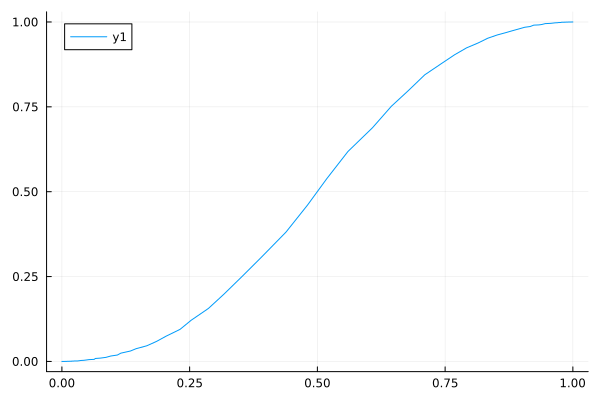

In [35]:
plot(A,B)

In [16]:
using CSV

In [19]:
load_results!(0.1, 2., "multi-stage")
allele_freqs = (cache_multistage.genotype_frequencies[:,end,:,3:5,3] .+ cache_multistage.genotype_frequencies[:,end,:,3:5,2] .* 0.5) |>
                @λ mean.(eachslice(_, dims = (1,2))) |> 
                @λ vcat(_'...)
x = repeat(1:300,100)
df = DataFrame(X = x, Y = allele_freqs)
CSV.write("test.csv", df)

"test.csv"

In [3]:
using MultivariateStats

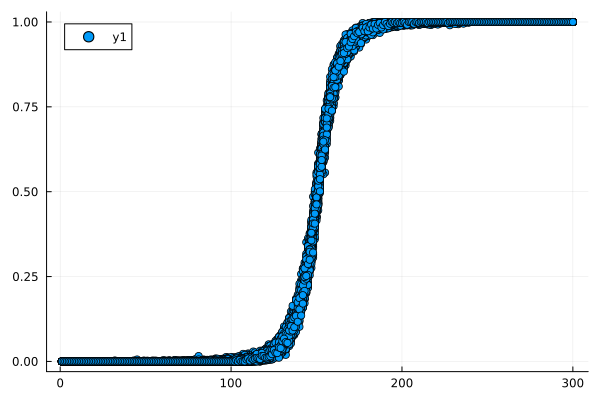

In [4]:
scatter(x,allele_freqs)

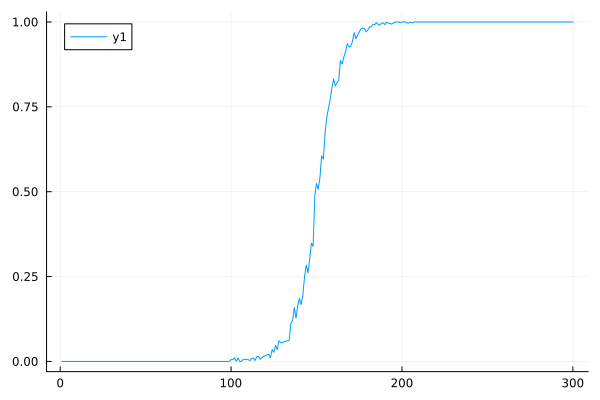

In [9]:
plot(1:300,allele_freqs[1:300])

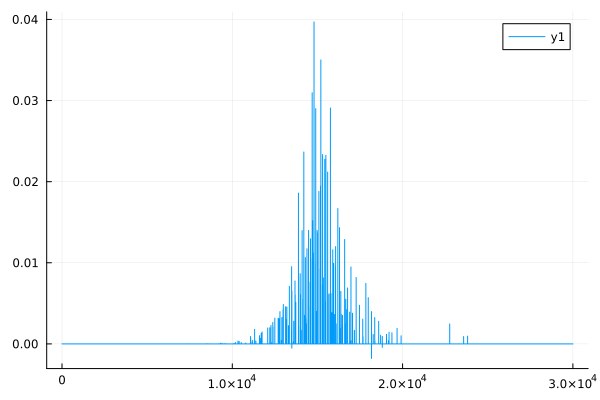

In [14]:
plot(isotonic(x,allele_freqs)[2:end] - isotonic(x,allele_freqs)[1:end-1])

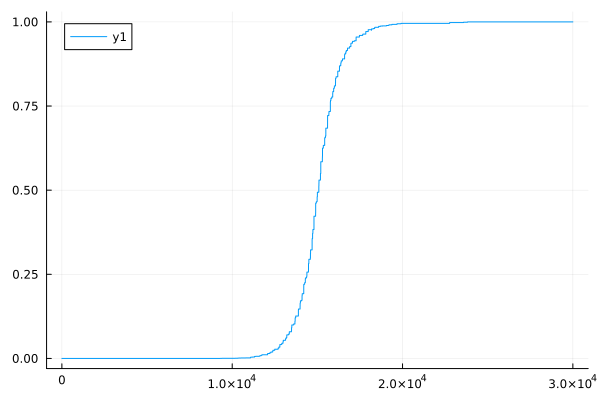

In [11]:
plot(isotonic(x,allele_freqs))

In [41]:

function calc_cline_widths(selection_coefficients, dispersal_distance, model)
    function calc_cline_width_multistage(selection_coefficient, dispersal_distance)
        load_results!(selection_coefficient, dispersal_distance, "multi-stage")
        allele_freqs = cache_multistage.genotype_frequencies[:,end,:,3:5,3] .+ cache_multistage.genotype_frequencies[:,end,:,3:5,2] .* 0.5
        function calc_cline_width_one_run(mean_allele_freqs_one_run)
            min_allele_freq = mean(mean_allele_freqs_one_run[1:30])
            max_allele_freq = mean(mean_allele_freqs_one_run[end-29:end])
            min_cline = min_allele_freq + (max_allele_freq - min_allele_freq) * 0.2
            max_cline = max_allele_freq - (max_allele_freq - min_allele_freq) * 0.2
        
            cline_lims = (findfirst((x -> x - max_cline > 0.01),mean_allele_freqs_one_run ), findfirst((x -> x - min_cline > 0.01),mean_allele_freqs_one_run ))
            cline_width = cline_lims[1] - cline_lims[2]
            cline_hight = mean_allele_freqs_one_run[cline_lims[1]] - mean_allele_freqs_one_run[cline_lims[2]]
            slope = cline_hight/cline_width
            return cline_lims,cline_width, slope
        end
        
        indices, obs_cline_widths, slopes = calc_cline_width_one_run.(eachrow(mean.(eachslice(allele_freqs[:,:,:], dims = (1,2))))) |> 
                                                @λ zip(_...) |> 
                                                collect |> 
                                                @λ (x -> vcat(x...)).(_)
        return indices, obs_cline_widths, slopes
    end
    function calc_cline_width_single_stage(selection_coefficient, dispersal_distance, model)
        load_results!(selection_coefficient, dispersal_distance, model)
        allele_freqs = cache_single_stage.genotype_frequencies[:,end,:,3] .+ cache_single_stage.genotype_frequencies[:,end,:,2] .* 0.5
        function calc_cline_width_one_run(allele_freqs_one_run)
            min_allele_freq = mean(allele_freqs_one_run[1:30])
            max_allele_freq = mean(allele_freqs_one_run[end-29:end])
            min_cline = min_allele_freq + (max_allele_freq - min_allele_freq) * 0.2
            max_cline = max_allele_freq - (max_allele_freq - min_allele_freq) * 0.2
        
            cline_lims = (findfirst((x -> x - max_cline > 0.01),allele_freqs_one_run ), findfirst((x -> x - min_cline > 0.01),allele_freqs_one_run ))
            cline_width = cline_lims[1] - cline_lims[2]
            cline_hight = allele_freqs_one_run[cline_lims[1]] - allele_freqs_one_run[cline_lims[2]]
            slope = cline_hight/cline_width
            return cline_lims,cline_width, slope
        end
        
        indices, obs_cline_widths, slopes = calc_cline_width_one_run.(eachrow(allele_freqs)) |> 
                                                @λ zip(_...) |> 
                                                collect |> 
                                                @λ (x -> vcat(x...)).(_)
        return indices, obs_cline_widths, slopes
    end
    if model == "multi-stage"
        obs_cline_widths, slopes_by_s = (@λ calc_cline_width_multistage(_, dispersal_distance)).(selection_coefficients) |> 
                                            @λ (x -> (x[2],x[3])).(_) |>
                                            @λ zip(_...) |> 
                                            collect |> 
                                            @λ (x -> hcat(x...)).(_)
        return obs_cline_widths, slopes_by_s
    elseif (model == "poisson") | (model == "binomial")
        obs_cline_widths, slopes_by_s = (@λ calc_cline_width_single_stage(_, dispersal_distance, model)).(selection_coefficients) |> 
                                            @λ (x -> (x[2],x[3])).(_) |>
                                            @λ zip(_...) |> 
                                            collect |> 
                                            @λ (x -> hcat(x...)).(_)
        return obs_cline_widths, slopes_by_s
    else
        throw("Incorrect model type")
    end
    

end
binomial_cline_widths, binomial_slopes = calc_cline_widths([0.1,0.2,0.3], 2.0, "binomial")
poisson_cline_widths, poisson_slopes = calc_cline_widths([0.1,0.2,0.3], 2.0, "poisson")
multi_stage_cline_widths, multi_stage_slopes = calc_cline_widths([0.1,0.2,0.3], 2.0, "multi-stage")


([17 10 11; 16 12 9; … ; 19 10 7; 17 11 9], [0.034225947351432306 0.056166203444202735 0.05830280313437635; 0.03639207586335639 0.051075542759564184 0.05984448034454274; … ; 0.030516366686737323 0.0531753418346246 0.08070980721995945; 0.03464430760519177 0.0496972460638393 0.07112698739877454])

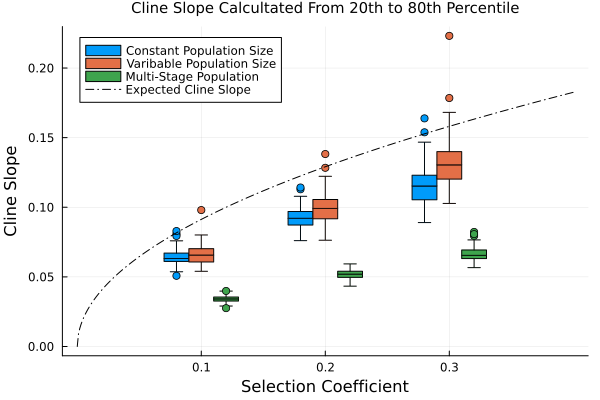

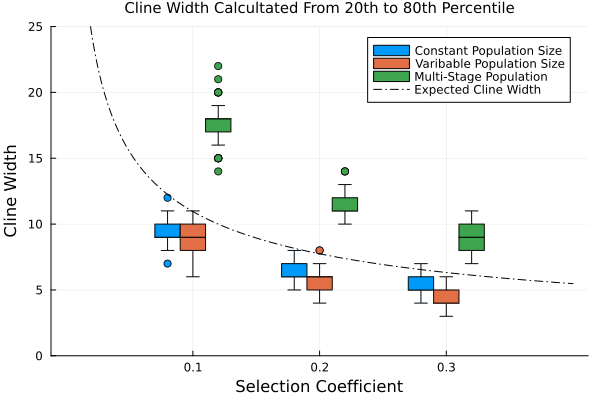

In [42]:
dispersal_distance = 2.
slopes_df = DataFrame(selection_coefficient = vcat(repeat([0.1], 100),
                                                   repeat([0.2], 100),
                                                   repeat([0.3], 100)),
                      binomial = reshape(binomial_slopes, (100*3)),
                      poisson = reshape(poisson_slopes, (100*3)),
                      multi_stage = reshape(multi_stage_slopes, (100*3)))

stacked_slopes = stack(slopes_df, [:binomial, :poisson, :multi_stage])

stacked_slopes.selection_coefficient =stacked_slopes.selection_coefficient
stacked_slopes.variable = categorical(stacked_slopes.variable; levels=["binomial", "poisson", "multi_stage"])
stacked_slopes.offset = stacked_slopes.variable |> @λ (x -> (x == "binomial") ? -1 : (x == "poisson") ? 0 : 1 ).(_)
width = 0.02

@df stacked_slopes boxplot(:selection_coefficient + width * :offset, 
                                      :value, 
                                      group=:variable, 
                                      bar_width = width,
                                      xlabel = "Selection Coefficient",
                                      ylabel = "Cline Slope",
                                      labels = ["Constant Population Size" "Varibable Population Size" "Multi-Stage Population"]
                                      ) |> 
                    @λ xticks!(_,selection_coefficients,string.(selection_coefficients)) |> 
                    @λ plot!(_, 0:0.001:0.4, 1/dispersal_distance * sqrt.((0:0.001:0.4)./3),
                          label = "Expected Cline Slope",
                          line = :dashdot,
                          color = :black,
                          title = "Cline Slope Calcultated From 20th to 80th Percentile",
                          titlefont = 10) |> 
                    display


p = plot!()

dispersal_distance = 2.
cline_width_df = DataFrame(selection_coefficient = vcat(repeat([0.1], 100),
                                                   repeat([0.2], 100),
                                                   repeat([0.3], 100)),
                      binomial = reshape(binomial_cline_widths, (100*3)),
                      poisson = reshape(poisson_cline_widths, (100*3)),
                      multi_stage = reshape(multi_stage_cline_widths, (100*3)))

stacked_cline_widths = stack(cline_width_df, [:binomial, :poisson, :multi_stage])

stacked_cline_widths.selection_coefficient =stacked_cline_widths.selection_coefficient
stacked_cline_widths.variable = categorical(stacked_cline_widths.variable; levels=["binomial", "poisson", "multi_stage"])
stacked_cline_widths.offset = stacked_cline_widths.variable |> @λ (x -> (x == "binomial") ? -1 : (x == "poisson") ? 0 : 1 ).(_)
width = 0.02

@df stacked_cline_widths boxplot(:selection_coefficient + width * :offset, 
                           :value, 
                           group=:variable, 
                           bar_width = width,
                           xlabel = "Selection Coefficient",
                           ylabel = "Cline Width",
                           labels = ["Constant Population Size" "Varibable Population Size" "Multi-Stage Population"]
                           ) |> 
                    @λ xticks!(_,selection_coefficients,string.(selection_coefficients))

plot!(0:0.001:0.4, dispersal_distance .* 1 ./ sqrt.((0:0.001:0.4)./3),
      label = "Expected Cline Width",
      line = :dashdot,
      color = :black,
      title = "Cline Width Calcultated From 20th to 80th Percentile",
      titlefont = 10,
      ylims = (0,25))





To get a better aproximation of the slope at x = 0 we can apply the logit transform to the allele frequencies:

$\text{logit}(y) = \ln(\frac{y}{1-y})$

We can then perform an OLS regression on the transformed data. This will result in a prediction of allele frequencies in the form:

$\text{logit}(y) = kx + m$

This has to be done on a restricted set of x-values to not get biased results. I am not sure of the best method of determining the region where the logit transform result in linear data. 

Using WolframAlpha to solve for $y'$ we get:

$y'(x) = \frac{ke^{kx +m}}{(e^{kx +m} +1)^2}$

$y'(0) = \frac{ke^{m}}{(e^{m} +1)^2}$

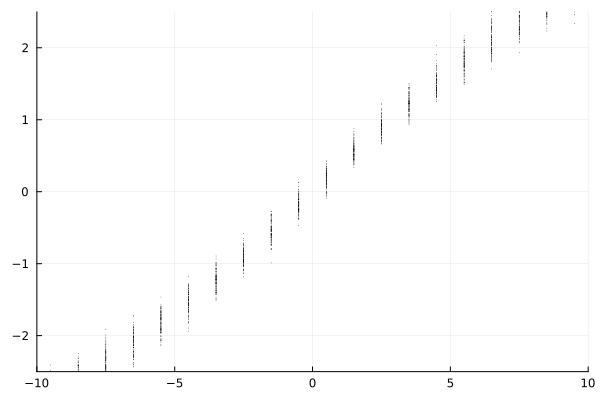

In [19]:
logit(x) = log(x / (1-x))
selection_coefficient, dispersal_distance, model = 0.1, 2.0, "binomial"

load_results!(selection_coefficient, dispersal_distance, model)


allele_freqs = ((cache_multistage.genotype_frequencies[:,end,:,:,3] .+ cache_multistage.genotype_frequencies[:,end,:,:,2] .* 0.5) 
                    |> @λ mean.(eachslice(_, dims = (1,2))))

x = -149.5:149.5
logit.(allele_freqs') |> @λ scatter(x, _, label = "", color = :black, markersize = 0.4)
ylims!(-2.5,2.5)
xlims!(-10,10)


In [22]:
using GLM, StatsBase
logit(x) = log(x / (1-x))
function calc_cline_slope_w_regression(selection_coefficient, dispersal_distance, model, ymax = 2)
     load_results!(selection_coefficient, dispersal_distance, model)
     if model == "multi-stage"
          allele_freqs = ((cache_multistage.genotype_frequencies[:,end,:,:,3] .+ cache_multistage.genotype_frequencies[:,end,:,:,2] .* 0.5) 
                              |> @λ mean.(eachslice(_, dims = (1,2))))
     elseif (model == "binomial") | (model == "poisson")
          allele_freqs = (cache_single_stage.genotype_frequencies[:,end,:,3] .+ cache_single_stage.genotype_frequencies[:,end,:,2] .* 0.5) 
     else
          throw("Incorrect model type")
     end
     x = -149.5:149.5
     df = DataFrame(X = repeat(x, 100) , Y = reshape(logit.(allele_freqs'), (300 * 100)))
     #the mean of the first and last x value who's assosiated absolute mean y value is less than ymax becomes the xmax
     xmax =  combine(groupby(df,:X), :Y => mean) |> (df -> (abs(df.X[findfirst((Y-> (abs(Y) < ymax)), df.Y_mean)]) + 
                                                                df.X[findlast((Y-> (abs(Y) < ymax)), df.Y_mean)])/2)
                                                         

     #data points who's absolute x-value is greater than the xmax are removed
     df = filter((row -> abs.(row.X) .< xmax), df)
     results = lm(@formula(Y ~ X), df)

     m,k = coef(results)
     std_err_m, std_err_k = stderror(results)
     pred_cline_slope = k*exp(m)/(exp(m)+1)^2
     return (m=m, k = k, std_err_m = std_err_m, std_err_k = std_err_k, pred_cline_slope = pred_cline_slope)
end

calc_cline_slope_w_regression(0.2, 2., "binomial")



(m = 0.0021362491663229123, k = 0.4382504197810998, std_err_m = 0.0063905155481296105, std_err_k = 0.0027890496408663, pred_cline_slope = 0.10956247994647594)

To include the uncertainty of the result we can use the standard errors of k and m to calculate a confidence interval of the final slope. The regression model assumes that k and m come from a normal distrubtion, and using this we can calculate the probability density of each pair of k and m.

$P(k,m) = P(k=k) * P(m=m)$

To calculate the probability of a given slope we want to integrate $P(k,m)$ over all p and k that result in the given slope. Since the slope at zero is: 

$y'(0) = \frac{ke^{m}}{(e^{m} +1)^2}$

We can solve for k as:

$k = \frac{y'(0)*e^{m}}{(e^{m} +1)^2}$

We can then integrate over all possible values of m:

$P(y'(0) = s) = \int_{-\infty}^\infty P(m=m) * P(k=\frac{s*e^{m}}{(e^{m} +1)^2}) dm$

This is a difficult equation to solve, so a bootstrapped solution may be better.


In [23]:
width = 0.02

function calc_cline_slope_with_conf(selection_coefficient, dispersal_distance, model, ymax = 3)
    m, k, std_err_m, std_err_k, pred_cline_slope =  calc_cline_slope_w_regression(selection_coefficient, dispersal_distance, model,ymax )


    m_sample = rand(Normal(m, std_err_m),100000)
    k_sample = rand(Normal(k, std_err_k),100000)

    #we calculate the standard devation around the predicted cline slope
    s = std(@. k_sample*exp(m_sample)/(exp(m_sample)+1)^2; mean = pred_cline_slope)
    conf_interval = s*1.96
    return (pred_cline_slope, conf_interval)

end
slopes_binom, confs_binom = calc_cline_width_with_conf.([0.1,0.2,0.3], 2., "binomial") |> 
                                @λ collect(zip(_...)) |> 
                                @λ (x -> vcat(x...)).(_)
slopes_poisson, confs_poisson = calc_cline_width_with_conf.([0.1,0.2,0.3], 2., "poisson") |> 
                                @λ collect(zip(_...)) |> 
                                @λ (x -> vcat(x...)).(_)
slopes_multi, confs_multi = calc_cline_width_with_conf.([0.1,0.2,0.3], 2., "multi-stage") |> 
                                @λ collect(zip(_...)) |> 
                                @λ (x -> vcat(x...)).(_)
slopes_df = DataFrame(selection_coefficient = [0.1,0.2,0.3], binomial = slopes_binom, poisson = slopes_poisson, multi_stage = slopes_multi)
confs_df = DataFrame(selection_coefficient = [0.1,0.2,0.3], binomial = confs_binom, poisson = confs_poisson, multi_stage = confs_multi)
#bar([0.1,0.2,0.3], slopes, yerror = confs, bar_width = 0.05,title = "Mean Cline Slope")
stacked_slopes = stack(slopes_df, [:binomial, :poisson, :multi_stage])

stacked_slopes.offset = stacked_slopes.variable |> @λ (x -> (x == "binomial") ? -1 : (x == "poisson") ? 0 : 1 ).(_)
stacked_slopes.variable = categorical(stacked_slopes.variable; levels=["binomial", "poisson", "multi_stage"])
stacked_slopes.conf = stack(confs_df, [:binomial, :poisson, :multi_stage]).value
mean_slope_plot = @df stacked_slopes bar(:selection_coefficient + width * :offset, 
                        :value,
                        group=:variable, 
                        yerror = :conf,
                        bar_width = width,
                        xlabel = "Selection Coefficient",
                        ylabel = "Cline Slope",
                        labels = ["Constant Population Size" "Varibable Population Size" "Multi-Stage Population"],
                        title = "Slope of Mean Cline",
                        titlefont = 10,
                        bar_position = :dodge
                        ) |> 
                        @λ xticks!(_,selection_coefficients,string.(selection_coefficients)) |> 
                        @λ plot!(_,0:0.001:0.4, 1/dispersal_distance * sqrt.((0:0.001:0.4)./3),
                               label = "Expected Cline Width",
                               line = :dashdot,
                               color = :black,
                               title = "Cline Slope Calcultated by Regression of Logit Allele Frequencies ",
                               titlefont = 10,
                            )


UndefVarError: UndefVarError: `calc_cline_width_with_conf` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

We have now calculated the slope of the mean cline, this time with a quantitative level of uncertainty, but we still want to calculated the individual cline slopes. 
This can be done in the same way as we calculated the mean cline.

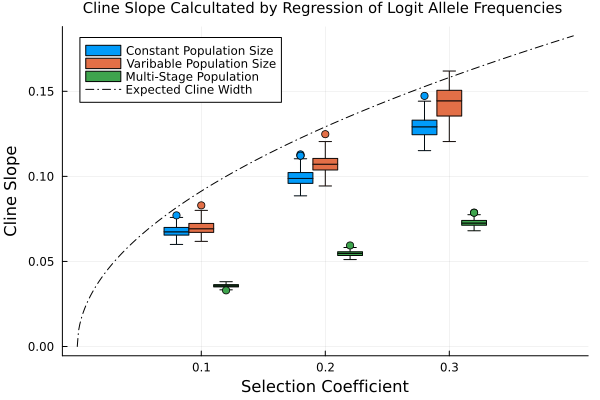

In [44]:
selection_coefficient, dispersal_distance = 0.1, 2.



function calc_cline_slope_w_regression_all_runs(selection_coefficient, dispersal_distance, model, ymax)
        load_results!(selection_coefficient, dispersal_distance, model)
        if model == "multi-stage"
                allele_freqs = ((cache_multistage.genotype_frequencies[:,end,:,3:5,3] .+ cache_multistage.genotype_frequencies[:,end,:,3:5,2] .* 0.5) 
                                |> @λ mean.(eachslice(_, dims = (1,2))))
        elseif (model == "binomial") | (model == "poisson")
                allele_freqs = (cache_single_stage.genotype_frequencies[:,end,:,3] .+ cache_single_stage.genotype_frequencies[:,end,:,2] .* 0.5) 
        else
                throw("Incorrect model type")
        end

        function calc_cline_slope_w_regression_one_run(index, ymax)
                x = -149.5:149.5
                y = logit.(allele_freqs[index,:])
                df = DataFrame(X=x, Y=y) |> 
                        @λ filter((row -> abs.(row.Y) .< ymax), _)
                results = lm(@formula(Y ~ X), df)

                m,k = coef(results)
                return k*exp(m)/(exp(m)+1)^2
        end
        calc_cline_slope_w_regression_one_run.(1:100, ymax)
end

slopes_binom = calc_cline_slope_w_regression_all_runs.([0.1,0.2,0.3], dispersal_distance, "binomial", 3) |> @λ vcat(_...)
slopes_poisson = calc_cline_slope_w_regression_all_runs.([0.1,0.2,0.3], dispersal_distance, "poisson", 3) |> @λ vcat(_...)
slopes_multi = calc_cline_slope_w_regression_all_runs.([0.1,0.2,0.3], dispersal_distance, "multi-stage", 3) |> @λ vcat(_...)

slopes_df = DataFrame(selection_coefficient = vcat(repeat([0.1], 100),
                                                   repeat([0.2], 100),
                                                   repeat([0.3], 100)),
                      binomial = reshape(slopes_binom, (100*3)),
                      poisson = reshape(slopes_poisson, (100*3)),
                      multi_stage = reshape(slopes_multi, (100*3)))

stacked_slopes = stack(slopes_df, [:binomial, :poisson, :multi_stage])

stacked_slopes.selection_coefficient =stacked_slopes.selection_coefficient
stacked_slopes.variable = categorical(stacked_slopes.variable; levels=["binomial", "poisson", "multi_stage"])
stacked_slopes.offset = stacked_slopes.variable |> @λ (x -> (x == "binomial") ? -1 : (x == "poisson") ? 0 : 1 ).(_)
width = 0.02


slopes_plot = @df stacked_slopes boxplot(:selection_coefficient + width * :offset, 
                           :value, 
                           group=:variable, 
                           bar_width = width,
                           xlabel = "Selection Coefficient",
                           ylabel = "Cline Slope",
                           labels = ["Constant Population Size" "Varibable Population Size" "Multi-Stage Population"]
                           ) |> 
                    @λ xticks!(_,selection_coefficients,string.(selection_coefficients)) |> 
                    @λ plot!(_,0:0.001:0.4, 1/dispersal_distance * sqrt.((0:0.001:0.4)./3),
                               label = "Expected Cline Width",
                               line = :dashdot,
                               color = :black,
                               title = "Cline Slope Calcultated by Regression of Logit Allele Frequencies ",
                               titlefont = 10,
                            )

In [ ]:
function cline_slopes_from_pq(selection_coefficient, dispersal_distance, model)
    load_results!(selection_coefficient, dispersal_distance, model)
    if model == "multi-stage"
            allele_freqs = ((cache_multistage.genotype_frequencies[:,end,:,:,3] .+ cache_multistage.genotype_frequencies[:,end,:,:,2] .* 0.5) 
                            |> @λ mean.(eachslice(_, dims = (1,2))))
    elseif (model == "binomial") | (model == "poisson")
            allele_freqs = (cache_single_stage.genotype_frequencies[:,end,:,3] .+ cache_single_stage.genotype_frequencies[:,end,:,2] .* 0.5) 
    else
            throw("Incorrect model type")
    end
    cline_slopes = 1 ./ (3 * sum.(eachrow(@. allele_freqs * (1 - allele_freqs))))

    slope_of_mean_cline = 1 / (3 *sum(mean.(eachcol(allele_freqs)) .* ( 1 .- mean.(eachcol(allele_freqs)))))

    return cline_slopes, slope_of_mean_cline
end

cline_slopes_binom, slope_of_mean_cline_binom = cline_slopes_from_pq.([0.1,0.2,0.3], 2., "binomial") |>
    @λ collect(zip(_...))
cline_slopes_poisson, slope_of_mean_cline_poisson = cline_slopes_from_pq.([0.1,0.2,0.3], 2., "poisson") |>
    @λ collect(zip(_...))
cline_slopes_multi, slope_of_mean_cline_multi =   cline_slopes_from_pq.([0.1,0.2,0.3], 2., "multi-stage") |>
    @λ collect(zip(_...))

   

2-element Vector{Tuple{Any, Any, Any}}:
 ([0.048087470079296396, 0.050590294234476405, 0.04906600953154491, 0.04869762769234718, 0.0477780315576722, 0.048801844110874855, 0.04784480864707307, 0.048585127672497994, 0.047461408103755924, 0.048820173227372664  …  0.048239912490287744, 0.04841085775262118, 0.048462954579771025, 0.048144017246520544, 0.04932792041875698, 0.04946315612018784, 0.04867614968590942, 0.0477056203629989, 0.047719021537260785, 0.05031967262582512], [0.07346653487123833, 0.07397943390618168, 0.07524743692895935, 0.07113518017105697, 0.07735447506821637, 0.07400656667710119, 0.0727009359447014, 0.0749903992091715, 0.0764192182865589, 0.07567873017738051  …  0.07515245284339925, 0.07293880298750052, 0.07616753243986527, 0.0770817267772721, 0.07850899172577755, 0.07569286572251696, 0.07395920280957276, 0.07401581892044905, 0.07522003675128254, 0.07399511935760797], [0.10053915522968025, 0.10381535626383928, 0.10203973924171449, 0.10143548012886495, 0.10199921082800315

In [30]:
function calc_cline_slope_with_conf(selection_coefficient, dispersal_distance, model, ymax = 3)
    m, k, std_err_m, std_err_k, pred_cline_slope =  calc_cline_slope_w_regression(selection_coefficient, dispersal_distance, model,ymax )


    m_sample = rand(Normal(m, std_err_m),100000)
    k_sample = rand(Normal(k, std_err_k),100000)

    #we calculate the standard devation around the predicted cline slope
    s = std(@. k_sample*exp(m_sample)/(exp(m_sample)+1)^2; mean = pred_cline_slope)
    conf_interval = s*1.96
    return (pred_cline_slope, conf_interval)

end


calc_cline_slope_with_conf (generic function with 2 methods)

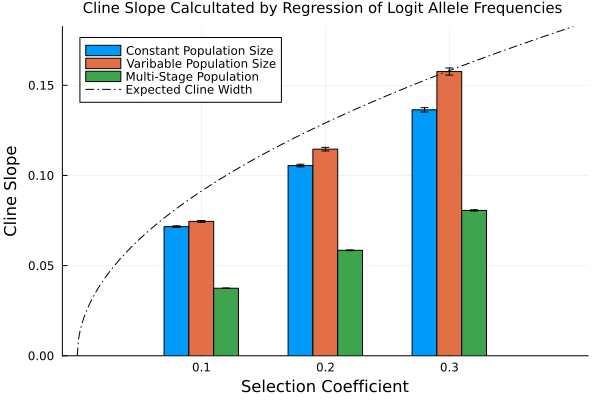

In [31]:
slopes_binom, confs_binom = calc_cline_slope_with_conf.([0.1,0.2,0.3], 2., "binomial") |> 
                                @λ collect(zip(_...)) |> 
                                @λ (x -> vcat(x...)).(_)
slopes_poisson, confs_poisson = calc_cline_slope_with_conf.([0.1,0.2,0.3], 2., "poisson") |> 
                                @λ collect(zip(_...)) |> 
                                @λ (x -> vcat(x...)).(_)
slopes_multi, confs_multi = calc_cline_slope_with_conf.([0.1,0.2,0.3], 2., "multi-stage") |> 
                                @λ collect(zip(_...)) |> 
                                @λ (x -> vcat(x...)).(_)
slopes_df = DataFrame(selection_coefficient = [0.1,0.2,0.3], binomial = slopes_binom, poisson = slopes_poisson, multi_stage = slopes_multi)
confs_df = DataFrame(selection_coefficient = [0.1,0.2,0.3], binomial = confs_binom, poisson = confs_poisson, multi_stage = confs_multi)
#bar([0.1,0.2,0.3], slopes, yerror = confs, bar_width = 0.05,title = "Mean Cline Slope")
stacked_slopes = stack(slopes_df, [:binomial, :poisson, :multi_stage])

stacked_slopes.offset = stacked_slopes.variable |> @λ (x -> (x == "binomial") ? -1 : (x == "poisson") ? 0 : 1 ).(_)
stacked_slopes.variable = categorical(stacked_slopes.variable; levels=["binomial", "poisson", "multi_stage"])
stacked_slopes.conf = stack(confs_df, [:binomial, :poisson, :multi_stage]).value
mean_slope_plot = @df stacked_slopes bar(:selection_coefficient + width * :offset, 
                        :value,
                        group=:variable, 
                        yerror = :conf,
                        bar_width = width,
                        xlabel = "Selection Coefficient",
                        ylabel = "Cline Slope",
                        labels = ["Constant Population Size" "Varibable Population Size" "Multi-Stage Population"],
                        title = "Slope of Mean Cline",
                        titlefont = 10,
                        bar_position = :dodge
                        ) |> 
                        @λ xticks!(_,selection_coefficients,string.(selection_coefficients)) |> 
                        @λ plot!(_,0:0.001:0.4, 1/dispersal_distance * sqrt.((0:0.001:0.4)./3),
                                label = "Expected Cline Width",
                                line = :dashdot,
                                color = :black,
                                title = "Cline Slope Calcultated by Regression of Logit Allele Frequencies ",
                                titlefont = 10,
                            )
    



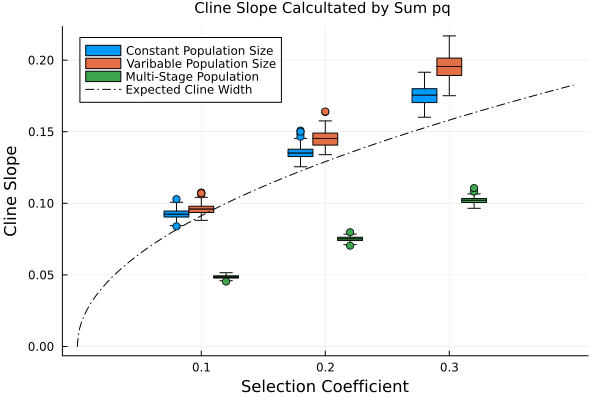

In [32]:
df = DataFrame(selection_coefficient = vcat(repeat([0.1], 100),
          repeat([0.2], 100),
          repeat([0.3], 100)),
          binomial = vcat(cline_slopes_binom...),
          poisson = vcat(cline_slopes_poisson...),
          multi_stage = vcat(cline_slopes_multi...)) |>
          @λ stack(_,  [:binomial, :poisson, :multi_stage]) 
df.variable = categorical(df.variable; levels=["binomial", "poisson", "multi_stage"])
df.offset = df.variable |> @λ (x -> (x == "binomial") ? -1 : (x == "poisson") ? 0 : 1 ).(_)


sum_pq_plot = @df df boxplot(:selection_coefficient + width * :offset, 
          :value, 
          group=:variable, 
          bar_width = width,
          xlabel = "Selection Coefficient",
          ylabel = "Cline Slope",
          labels = ["Constant Population Size" "Varibable Population Size" "Multi-Stage Population"]
          ) |> 
   @λ xticks!(_,selection_coefficients,string.(selection_coefficients)) |> 
   @λ plot!(_,0:0.001:0.4, 1/dispersal_distance * sqrt.((0:0.001:0.4)./3),
              label = "Expected Cline Width",
              line = :dashdot,
              color = :black,
              title = "Cline Slope Calcultated by Sum pq ",
              titlefont = 10,
           )

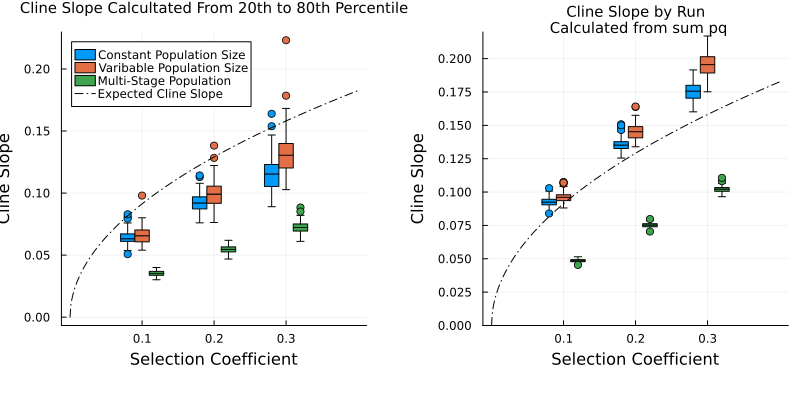

In [39]:
plot(p, sum_pq_plot, size = (800,400))

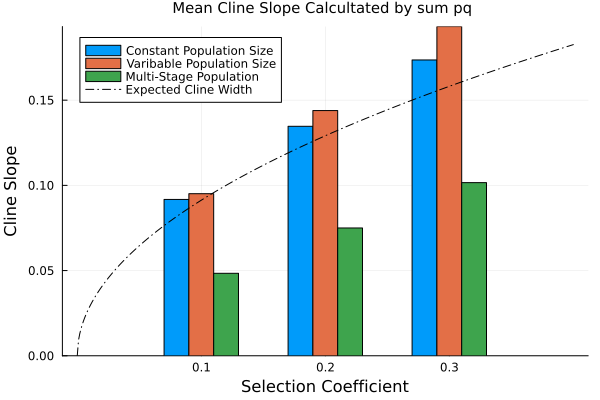

In [33]:
df = DataFrame(selection_coefficient = [0.1,0.2,0.3],
          binomial = vcat(slope_of_mean_cline_binom...),
          poisson = vcat(slope_of_mean_cline_poisson...),
          multi_stage = vcat(slope_of_mean_cline_multi...)) |>
          @λ stack(_,  [:binomial, :poisson, :multi_stage]) 
df.variable = categorical(df.variable; levels=["binomial", "poisson", "multi_stage"])
df.offset = df.variable |> @λ (x -> (x == "binomial") ? -1 : (x == "poisson") ? 0 : 1 ).(_)

mean_sum_pq_plot = @df df bar(:selection_coefficient + width * :offset, 
    :value,
    group=:variable, 
    bar_width = width,
    xlabel = "Selection Coefficient",
    ylabel = "Cline Slope",
    labels = ["Constant Population Size" "Varibable Population Size" "Multi-Stage Population"],
    title = "Slope of Mean Cline",
    titlefont = 10,
    bar_position = :dodge
    ) |> 
    @λ xticks!(_,selection_coefficients,string.(selection_coefficients)) |> 
    @λ plot!(_,0:0.001:0.4, 1/dispersal_distance * sqrt.((0:0.001:0.4)./3),
        label = "Expected Cline Width",
        line = :dashdot,
        color = :black,
        title = "Mean Cline Slope Calcultated by sum pq ",
        titlefont = 10,
        )

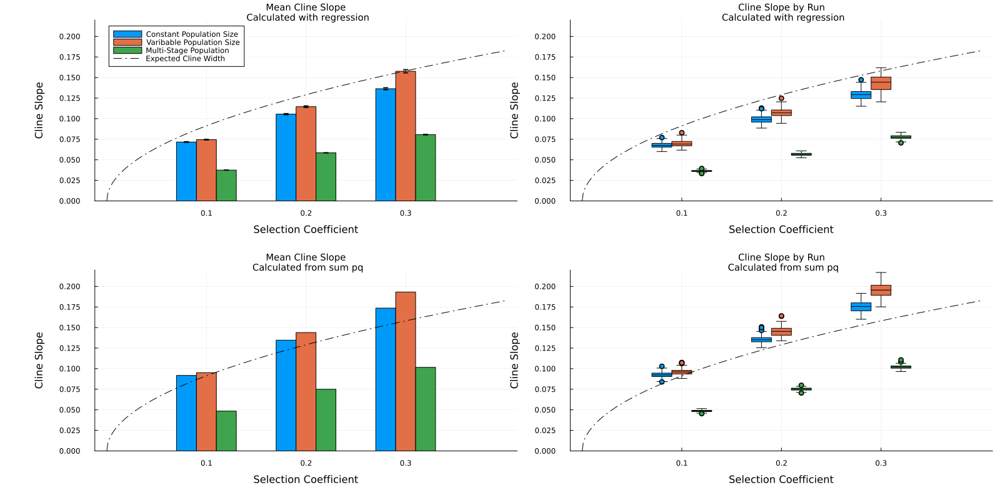

In [34]:
using Measures
plot((mean_slope_plot |> 
          @λ ylims!(_,0,0.22) |>
          @λ title!(_, "Mean Cline Slope\n Calculated with regression") |>
          @λ yticks!(_,0:0.025:0.2))
     ,
     (slopes_plot |> 
          @λ ylims!(_,0,0.22,
                     legend = false,
                    left_margin = [10mm 0mm],
                    bottom_margin = [10mm 0mm])|>
          @λ title!(_, "Cline Slope by Run\n Calculated with regression") |>
          @λ yticks!(_,0:0.025:0.2)),
     (mean_sum_pq_plot |> 
          @λ ylims!(_,0,0.22,
                    legend = false,
                    left_margin = [10mm 0mm],
                    bottom_margin = [10mm 0mm]) |>
          @λ title!(_, "Mean Cline Slope\n Calculated from sum pq") |>
          @λ yticks!(_,0:0.025:0.2)),
     (sum_pq_plot |>
          @λ ylims!(_,0,0.22,
                    legend = false,
                    left_margin = [10mm 0mm],
                    bottom_margin = [10mm 0mm]) |>
          @λ title!(_, "Cline Slope by Run\n Calculated from sum pq") |>
          @λ yticks!(_,0:0.025:0.2)),
     left_margin = [20mm 0mm],
     size = (800*2,400*2))